# Homework 2

In [150]:
import pandas as pd
import csv

f = pd.read_csv('Combined_News_DJIA.csv')
f.head()

,Date,Label,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,...,Top16,Top17,Top18,Top19,Top20,Top21,Top22,Top23,Top24,Top25
0,2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",...,b'Georgia Invades South Ossetia - if Russia ge...,b'Al-Qaeda Faces Islamist Backlash',"b'Condoleezza Rice: ""The US would not act to p...",b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge"""
1,2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,...,b'Israel and the US behind the Georgian aggres...,"b'""Do not believe TV, neither Russian nor Geor...",b'Riots are still going on in Montreal (Canada...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo..."
2,2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...",...,b'U.S. troops still in Georgia (did you know t...,b'Why Russias response to Georgia was right',"b'Gorbachev accuses U.S. of making a ""serious ...","b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'Christopher King argues that the US and NATO...,b'America: The New Mexico?',"b""BBC NEWS | Asia-Pacific | Extinction 'by man..."
3,2008-08-13,0,b' U.S. refuses Israel weapons to attack Iran:...,"b""When the president ordered to attack Tskhinv...",b' Israel clears troops who killed Reuters cam...,b'Britain\'s policy of being tough on drugs is...,b'Body of 14 year old found in trunk; Latest (...,b'China has moved 10 *million* quake survivors...,"b""Bush announces Operation Get All Up In Russi...",b'Russian forces sink Georgian ships ',...,b'Elephants extinct by 2020?',b'US humanitarian missions soon in Georgia - i...,"b""Georgia's DDOS came from US sources""","b'Russian convoy heads into Georgia, violating...",b'Israeli defence minister: US against strike ...,b'Gorbachev: We Had No Choice',b'Witness: Russian forces head towards Tbilisi...,b' Quarter of Russians blame U.S. for conflict...,b'Georgian president says US military will ta...,b'2006: Nobel laureate Aleksander Solzhenitsyn...
4,2008-08-14,1,b'All the experts admit that we should legalis...,b'War in South Osetia - 89 pictures made by a ...,b'Swedish wrestler Ara Abrahamian throws away ...,b'Russia exaggerated the death toll in South O...,b'Missile That Killed 9 Inside Pakistan May Ha...,"b""Rushdie Condemns Random House's Refusal to P...",b'Poland and US agree 

Так как нам важны данные за день, соберем все новости Top1 - Top25 за каждый день в еще одну колонку и посчитаем среднюю длину (взято с источника https://www.kaggle.com/hsrobo/tf-idf-svm-baseline):

In [151]:
#f = f.drop('length', axis = 1)
f["combined_news"] = f.filter(regex=("Top.*")).apply(lambda x: ''.join(str(x.values)), axis=1)
f['length'] = f["combined_news"].map(lambda text: len(text))
f['mean_length'] = f["combined_news"].map(lambda text:len(text)//25)
f.head()

,Date,Label,Top1,Top2,Top3,Top4,Top5,Top6,Top7,Top8,...,Top19,Top20,Top21,Top22,Top23,Top24,Top25,combined_news,length,mean_length
0,2008-08-08,0,"b""Georgia 'downs two Russian warplanes' as cou...",b'BREAKING: Musharraf to be impeached.',b'Russia Today: Columns of troops roll into So...,b'Russian tanks are moving towards the capital...,"b""Afghan children raped with 'impunity,' U.N. ...",b'150 Russian tanks have entered South Ossetia...,"b""Breaking: Georgia invades South Ossetia, Rus...","b""The 'enemy combatent' trials are nothing but...",...,b'This is a busy day: The European Union has ...,"b""Georgia will withdraw 1,000 soldiers from Ir...",b'Why the Pentagon Thinks Attacking Iran is a ...,b'Caucasus in crisis: Georgia invades South Os...,b'Indian shoe manufactory - And again in a se...,b'Visitors Suffering from Mental Illnesses Ban...,"b""No Help for Mexico's Kidnapping Surge""","[ 'b""Georgia \'downs two Russian warplanes\' a...",2458,98
1,2008-08-11,1,b'Why wont America and Nato help us? If they w...,b'Bush puts foot down on Georgian conflict',"b""Jewish Georgian minister: Thanks to Israeli ...",b'Georgian army flees in disarray as Russians ...,"b""Olympic opening ceremony fireworks 'faked'""",b'What were the Mossad with fraudulent New Zea...,b'Russia angered by Israeli military sale to G...,b'An American citizen living in S.Ossetia blam...,...,b'China to overtake US as largest manufacturer',b'War in South Ossetia [PICS]',b'Israeli Physicians Group Condemns State Tort...,b' Russia has just beaten the United States ov...,b'Perhaps *the* question about the Georgia - R...,b'Russia is so much better at war',"b""So this is what it's come to: trading sex fo...","[ ""b'Why wont America and Nato help us? If the...",1751,70
2,2008-08-12,0,b'Remember that adorable 9-year-old who sang a...,"b""Russia 'ends Georgia operation'""","b'""If we had no sexual harassment we would hav...","b""Al-Qa'eda is losing support in Iraq because ...",b'Ceasefire in Georgia: Putin Outmaneuvers the...,b'Why Microsoft and Intel tried to kill the XO...,b'Stratfor: The Russo-Georgian War and the Bal...,"b""I'm Trying to Get a Sense of This Whole Geor...",...,"b'Russia, Georgia, and NATO: Cold War Two'",b'Remember that adorable 62-year-old who led y...,b'War in Georgia: The Israeli connection',b'All signs point to the US encouraging Georgi...,b'Christopher King argues that the US and NATO...,b'America: The New Mexico?',"b""BBC NEWS | Asia-Pacific | Extinction 'by man...","[ ""b'Remember that adorable 9-year-old who san...",2251,90
3,2008-08-13,0,b' U.S. refuses Israel weapons to attack Iran:...,"b""When the president ordered to attack Tskhinv...",b' Israel clears troops who killed Reuters cam...,b'Britain\'s policy of being tough on drugs is...,b'Body of 14 year old found in trunk; Latest (...,b'China has moved 10 *million* quake survivors...,"b""Bush announces Operation Get All Up In Russi...",b'Russian forces sink Georgian ships ',...,"b'Russian convoy heads into Georgia, violating...",b'Israeli defence minister: US against strike ...,b'Gorbachev: We Had No Choice',b'Witness: Russian forces head towards Tbilisi...,b' Quarter of Russians blame U.S. for conflict...,b'Georgian president says US military will ta...,b'2006: Nobel laureate Aleksander Solzhenitsyn...,"[""b' U.S. refuses Israel weapons to attack Ira...",2143,85
4,2008-08-14,1,b'All the experts admit that we should legalis...,b'War in South Osetia - 89 pictures made by a ...,b'Swedish wrestler Ara Abrahamian throws away ...,b'Russia exaggerated the death toll in South O...,b'Missile That Killed 9 Inside Pakistan May Ha...,"b""Rushdie Condemns Random House's Refusal to P...",b'Poland and US agree to missle defense deal. ...,"b'Will the Russians conquer Tblisi? Bet on it,...",...,"b'""Non-media"" photos of South Ossetia/Georgia ...",b'Georgian TV reporter shot by Russian sniper ...,b'Saudi Arabia: Mother moves to block child ma...,b'Taliban wages war on humanitarian aid workers',"b'Russia: World 

In [152]:
f['mean_length']= f["mean_length"].astype('int64')

In [153]:
f["Label"] = f["Label"].astype('category')
f["Label"].dtypes

category

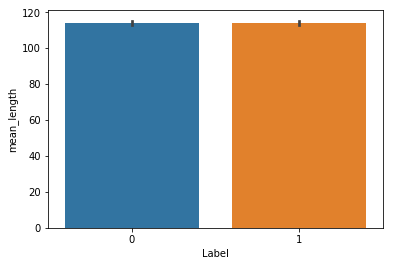

In [154]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.barplot(x="Label", y="mean_length",  data=f)
plt.show()

Rf

In [85]:

f.groupby('Label').describe()

length  mean_length
Label                                
0     count   924.000000   924.000000
      mean   2863.928571   114.057359
      std     438.331883    17.520147
      min    1617.000000    64.000000
      25%    2559.000000   102.000000
      50%    2874.500000   114.500000
      75%    3170.750000   126.000000
      max    4204.000000   168.000000
1     count  1065.000000  1065.000000
      mean   2861.646948   113.985915
      std     436.346845    17.458134
      min    1563.000000    62.000000
      25%    2574.000000   102.000000
      50%    2865.000000   114.000000
      75%    3150.000000   126.000000
      max    4536.000000   181.000000

In [147]:
for i in f['combined_news']:
    print(i)

[ 'b"Georgia \'downs two Russian warplanes\' as countries move to brink of war"'
 "b'BREAKING: Musharraf to be impeached.'"
 "b'Russia Today: Columns of troops roll into South Ossetia; footage from fighting (YouTube)'"
 "b'Russian tanks are moving towards the capital of South Ossetia, which has reportedly been completely destroyed by Georgian artillery fire'"
 'b"Afghan children raped with \'impunity,\' U.N. official says - this is sick, a three year old was raped and they do nothing"'
 "b'150 Russian tanks have entered South Ossetia whilst Georgia shoots down two Russian jets.'"
 'b"Breaking: Georgia invades South Ossetia, Russia warned it would intervene on SO\'s side"'
 'b"The \'enemy combatent\' trials are nothing but a sham: Salim Haman has been sentenced to 5 1/2 years, but will be kept longer anyway just because they feel like it."'
 "b'Georgian troops retreat from S. Osettain capital, presumably leaving several hundred people killed. [VIDEO]'"
 "b'Did the U.S. Prep Georgia for 

## Предобработка текста:

Удаляем знаки препинания. 

In [164]:

f['combined_news'] = [re.sub('[.:;,!"?\/\\()[]-]', '', i) for i in f['combined_news']]
f['combined_news'] = [re.sub("b'", '', i) for i in f['combined_news']]
f['combined_news'] = [re.sub("'b", '', i) for i in f['combined_news']]
f['combined_news'] = [re.sub("'", '', i) for i in f['combined_news']]
f['combined_news'] = [re.sub('[\\\]', '', i) for i in f['combined_news']]
for i in f['combined_news']:
    print(i)    

[ Georgia downs two Russian warplanes as countries move to brink of war
 BREAKING Musharraf to be impeached
 Russia Today Columns of troops roll into South Ossetia footage from fighting YouTube
 Russian tanks are moving towards the capital of South Ossetia which has reportedly been completely destroyed by Georgian artillery fire
 Afghan children raped with impunity UN official says  this is sick a three year old was raped and they do nothing
 150 Russian tanks have entered South Ossetia whilst Georgia shoots down two Russian jets
 Breaking Georgia invades South Ossetia Russia warned it would intervene on SOs side
 The enemy combatent trials are nothing but a sham Salim Haman has been sentenced to 5 12 years but will be kept longer anyway just because they feel like it
 Georgian troops retreat from S Osettain capital presumably leaving several hundred people killed [VIDEO]
 Did the US Prep Georgia for War with Russia
 Rice Gives Green Light for Israel to Attack Iran Says US has no veto 

In [165]:
f.groupby('Label').describe()

length  mean_length
Label                                
0     count   924.000000   924.000000
      mean   2863.928571   114.057359
      std     438.331883    17.520147
      min    1617.000000    64.000000
      25%    2559.000000   102.000000
      50%    2874.500000   114.500000
      75%    3170.750000   126.000000
      max    4204.000000   168.000000
1     count  1065.000000  1065.000000
      mean   2861.646948   113.985915
      std     436.346845    17.458134
      min    1563.000000    62.000000
      25%    2574.000000   102.000000
      50%    2865.000000   114.000000
      75%    3150.000000   126.000000
      max    4536.000000   181.000000